In [1]:
%load_ext autoreload
%autoreload 2

In [2]:
from IPython.display import display, Image
import arviz
import pymc3
import numpy
import pandas
from matplotlib import pyplot, cm
import ipywidgets

import dataloading
import models
import plotting

You are running the v4 development version of PyMC3 which currently still lacks key features. You probably want to use the stable v3 instead which you can either install via conda or find on the v3 GitHub branch: https://github.com/pymc-devs/pymc3/tree/v3


TypeError: __init__() got an unexpected keyword argument 'A_structure'

### Fetch data and calibrations

In [ ]:
design_cols = ["iptg", "glucose"]
df_layout = dataloading.get_layout(r"multibatch\FullWellDescription.xlsx", design_cols)
df_time, df_A360, df_A600 = dataloading.vectorize_observations(
    df_layout,
    observations={
         "Carboxylase_19": (
             dataloading.read_absorbances(r"multibatch\Carboxylase_19_360nm.csv"),
             dataloading.read_absorbances(r"multibatch\Carboxylase_19_600nm.csv"),
         ),
         "Carboxylase_20": (
             dataloading.read_absorbances(r"multibatch\Carboxylase_20_360nm.csv"),
             dataloading.read_absorbances(r"multibatch\Carboxylase_20_600nm.csv"),
         ),
        "Carboxylase_21": (
             dataloading.read_absorbances(r"multibatch\Carboxylase_19_360nm.csv"),
             dataloading.read_absorbances(r"multibatch\Carboxylase_19_600nm.csv"),
         ),
    }
)

cm_600 = models.LinearBiomassAbsorbanceModel.load("calibration_A600_multibatch.json")

### Construct the full model

In [ ]:
with pymc3.Model() as pmodel:
    pmodel = models.build_model(
        df_layout,    # for mapping reaction and assay wells
        df_time,
        df_A360,
        df_A600,
        cm_600,       # for learning about X from A600
        kind="GP mass action",
        design_cols=design_cols,
    )

# Optional: Plot the model in plate notation
display(pymc3.model_to_graphviz(pmodel))

### Hit the inference button!

In [452]:
with pmodel:
    idata = pymc3.sample()

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (3 chains in 3 jobs)
NUTS: [X, S0, time_delay, k_design, run_effect, k_reaction, A360_per_X, A360_per_P]


Sampling 3 chains for 1_000 tune and 1_000 draw iterations (3_000 + 3_000 draws total) took 156 seconds.
The number of effective samples is smaller than 25% for some parameters.


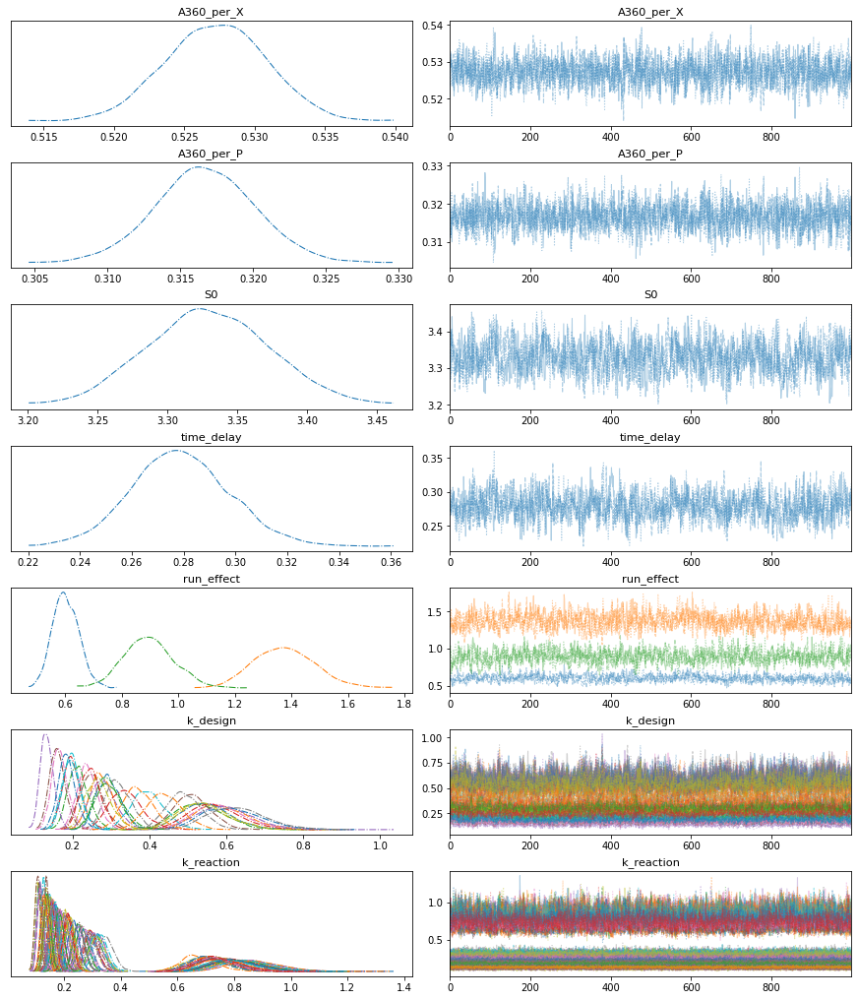

In [453]:
interesting_variables = [
    "A360_per_X",
    "A360_per_P",
    "S0",
    "time_delay",
    "run_effect",
    #"ls",
    #"scaling",
    "k_design",
    "k_reaction",
]
arviz.plot_trace(idata, var_names=interesting_variables, combined=True);

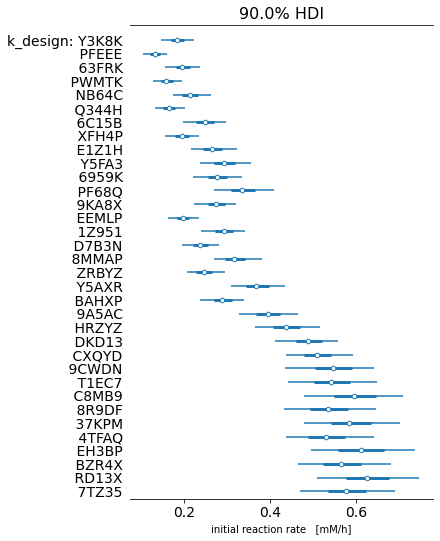

The plot shows the smallest interval in which the metric lies with a probability of 90.0 %.


In [465]:
ordered_designs = []
for d in df_layout[df_layout["product"].isna()].sort_values(design_cols[::-1]).design_id:
    if d not in ordered_designs:
        ordered_designs.append(d)

hdi_prob = 0.9
arviz.plot_forest(
    idata,
    var_names=["k_design"],
    combined=True,
    hdi_prob=hdi_prob,
    coords={
        "design_id": ordered_designs,
    }
)
pyplot.xlabel("initial reaction rate   [mM/h]")
pyplot.show()
print(f"The plot shows the smallest interval in which the metric lies with a probability of {hdi_prob*100} %.")

In [491]:
order = df_layout.reset_index().set_index("design_id").loc[ordered_designs].replicate_id

def fn_plot(rid):
    plotting.plot_reaction(idata, rid, cm_600=cm_600, reaction_order=order)
    return

ipywidgets.interact(
    fn_plot,
    rid=order,
);

interactive(children=(Dropdown(description='rid', options=('PP3WD', 'D77AR', 'C437W', 'H8DQ4', 'TM573', 'CN8D7…

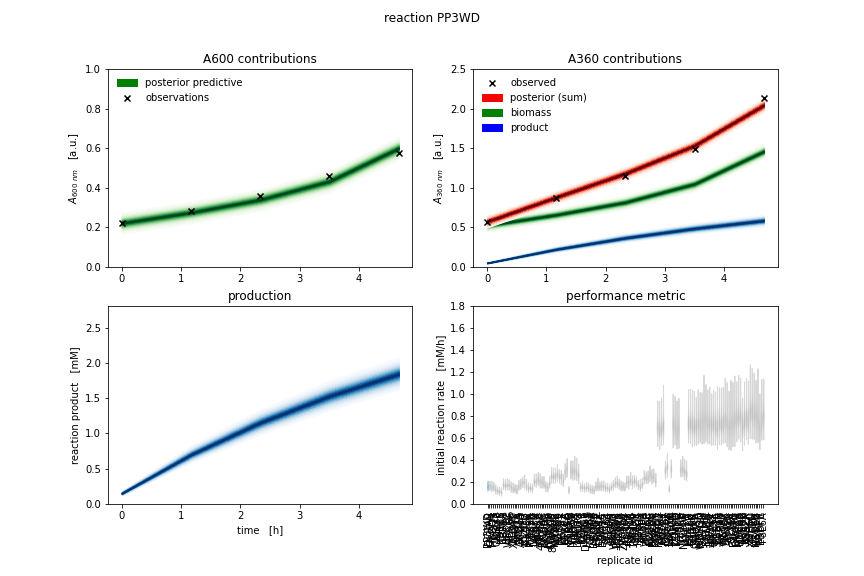

In [351]:
fp_out = plotting.plot_gif(
    fn_plot=fn_plot,
    fp_out="reaction_results.gif",
    data=order,
    fps=3
)
Image(fp_out)

In [129]:
df_summary = df_layout[numpy.isin(df_layout.index, idata.posterior.reaction)].copy()
df_summary["median_k"] = [
    numpy.median(idata.posterior.k_reaction.sel(reaction=row.Index))
    for row in df_summary.itertuples()
]
df_summary

,run,assay_well,reactor,group,product,biomass,iptg,glucose,median_k
replicate_id,,,,,,,,,
PP3WD,Carboxylase_21,A01,A1,0.75/1.0,NaN,NaN,0.75,1.0,0.165104
TANKY,Carboxylase_21,A02,A2,3.75/1.0,NaN,NaN,3.75,1.0,0.176709
1TBT3,Carboxylase_21,A03,A3,0.75/1.5,NaN,NaN,0.75,1.5,0.168058
LADTD,Carboxylase_21,A04,A4,3.75/1.5,NaN,NaN,3.75,1.5,0.218721
HM8H6,Carboxylase_21,A05,A5,0.75/2.0,NaN,NaN,0.75,2.0,0.193448
...,...,...,...,...,...,...,...,...,...
ZLH56,Carboxylase_19,H02,H2,0.30/4.8,NaN,NaN,0.30,4.8,0.130117
Z7CMW,Carboxylase_19,H03,H3,0.50/4.8,NaN,NaN,0.50,4.8,0.138844
8TFB5,Carboxylase_19,H04,H4,0.70/4.8,NaN,NaN,0.70,4.8,0.149101


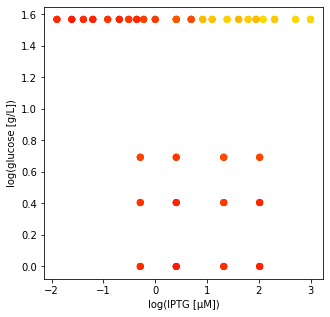

In [135]:
fig, ax = pyplot.subplots(figsize=(5, 5))

ax.scatter(
    numpy.log(df_summary.iptg),
    numpy.log(df_summary.glucose),
    color=cm.autumn(df_summary.median_k)
)
ax.set(
    ylabel="log(glucose [g/L])",
    xlabel="log(IPTG [µM])",
)

pyplot.show()

NameError: name 'df_layout' is not defined

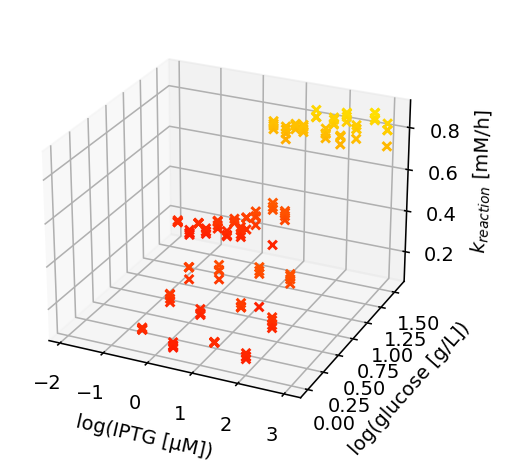

In [157]:
from matplotlib import pyplot, cm
from mpl_toolkits.mplot3d import axes3d


D = 2
BOUNDS = numpy.array([
    (-2, 3),
    (0, 1.6),
])

X = numpy.array([
    numpy.log(df_summary.iptg),
    numpy.log(df_summary.glucose),
]).T
Y = df_summary.median_k

n = 100
# create coordinates for cross-sections
X_denses = {}
for d, (lb, ub) in enumerate(BOUNDS):
    x_dense = numpy.zeros((100, D))
    x_dense[:,d] = numpy.linspace(lb, ub, 100)
    X_denses[f'D{d}'] = x_dense
del x_dense


fig = pyplot.figure(dpi=140)
ax = fig.add_subplot(111, projection='3d')

# create X-coordinates for plotting
n = 100

# Plot a basic wireframe.
ax.set_xlabel('log(IPTG [µM])')
ax.set_ylabel('log(glucose [g/L])')
ax.set_zlabel('$k_{reaction}$ [mM/h]')

# plot observations
ax.scatter(
    X[:,0], X[:,1], Y,
    color=cm.autumn(Y),
    marker='x',
    alpha=1
)
ax.view_init(elev=25, azim=-65)

pyplot.show()

In [181]:
with pymc3.Model() as gpmodel:
    span = numpy.ptp(BOUNDS, axis=1)
    ls = pymc3.Lognormal('ls', mu=numpy.log(span/2), sd=0.5, shape=span.shape)
    
    # we expect the function to explain most of the variance, so center a prior
    # on the data amplitude
    scaling = pymc3.Lognormal('scaling', mu=numpy.log(numpy.ptp(Y)), sd=0.2)
    # observation noise of around 10 % of the data amplitude sounds realistic..
    sigma = pymc3.Lognormal('sigma', mu=numpy.log(numpy.ptp(Y) / 10), sd=0.2)

    # construct the GP
    # the literature describes RFFs only for 0 mean !!!
    mean_func = pymc3.gp.mean.Zero()
    cov_func = scaling**2 * pymc3.gp.cov.ExpQuad(
        input_dim=D,
        ls=ls
    )
    # the literature only describes RFFs for normally distributed observation noise
    # therefore, we can use gp.Marginal and don't need to use gp.Latent
    gp = pymc3.gp.Marginal(mean_func=mean_func, cov_func=cov_func)
    gp.marginal_likelihood('L', X, pymc3.Data("median_k", Y), noise=sigma)

In [182]:
with gpmodel:
    map_ = pymc3.find_MAP()

In [183]:
with gpmodel:
    idata = pymc3.sample(tune=1000, draws=1000)

Auto-assigning NUTS sampler...
Initializing NUTS using jitter+adapt_diag...
Multiprocess sampling (3 chains in 3 jobs)
NUTS: [ls, scaling, sigma]


Sampling 3 chains for 1_000 tune and 1_000 draw iterations (3_000 + 3_000 draws total) took 178 seconds.


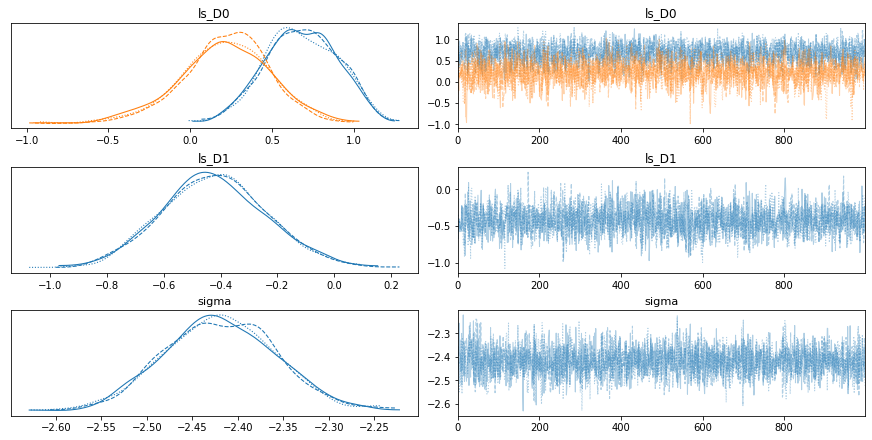

In [184]:
axs = arviz.plot_trace(idata, var_names=['ls', 'scaling', 'sigma'], transform=numpy.log)
for d, axr in zip(range(D), axs):
    dname = f'D{d}'
    for ax in axr:
        ax.set_title(f'ls_{dname}')
pyplot.show()

In [186]:
# add observations, conditioned on slices of x-coordinates to the model
with gpmodel:
    for dname, x_dense in X_denses.items():
        gp.conditional(dname, Xnew=x_dense)

WARNING (aesara.tensor.blas): We did not find a dynamic library in the library_dir of the library we use for blas. If you use ATLAS, make sure to compile it with dynamics library.


In [187]:
with gpmodel:
    pp_map = pymc3.sample_posterior_predictive(
        [map_]*1000,
        var_names=list(X_denses.keys()),
        random_seed=None
    )
    pp_mcmc = pymc3.sample_posterior_predictive(
        idata.posterior,
        samples=1000,
        var_names=list(X_denses.keys()),
        random_seed=None
    )

<ipython-input-187-3a5676522d1e>:7: UserWarning: samples parameter is smaller than nchains times ndraws, some draws and/or chains may not be represented in the returned posterior predictive sample
  pp_mcmc = pymc3.sample_posterior_predictive(


In [197]:
import pyrff
import fastprogress

M = 200
N_rffs = 1000
C = idata.posterior.dims['chain']
S = idata.posterior.dims['draw']
posterior_indices = numpy.random.randint(low=0, high=C * S, size=N_rffs)
rffs_mcmc = []
for i in fastprogress.progress_bar(posterior_indices):
    try:
        rff = pyrff.sample_rff(
            lengthscales=idata.posterior['ls'].values.reshape(C * S, D)[i],
            scaling=idata.posterior['scaling'].values.reshape(C * S,)[i],
            noise=idata.posterior['sigma'].values.reshape(C * S,)[i],
            # because the model uses the ExpQuad kernel:
            kernel_nu=numpy.inf,
            X=X,
            Y=Y,
            M=M,
        )
        rffs_mcmc.append(rff)
    except numpy.linalg.LinAlgError:
        pass

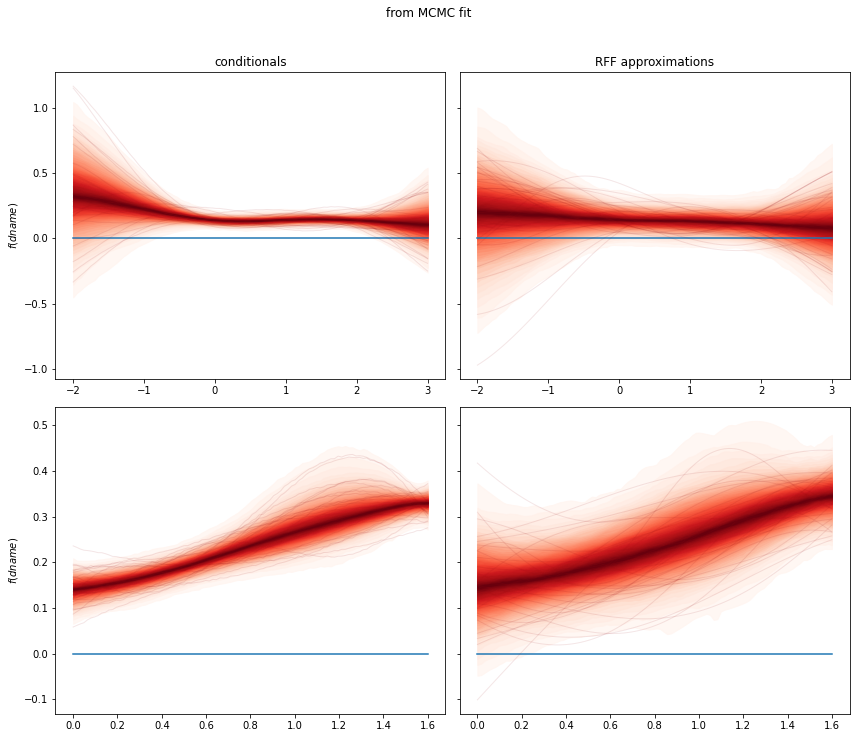

In [224]:
label, pp, rffs = ('MCMC', pp_mcmc, rffs_mcmc)

fig, axs = pyplot.subplots(nrows=D, ncols=2, figsize=(12, 5*D), squeeze=False, sharey='row')

for d, (left, right) in enumerate(axs):
    dname = f'D{d}'
    x_dense = X_denses[dname]

    # plot functions
    for fname, f in [
            ('GP mean function', lambda x: gp.mean_func(x).eval())
        ]:
        left.plot(x_dense[:,d], f(x_dense), label=fname)
        right.plot(x_dense[:,d], f(x_dense), label=fname)

    # plot conditionals and approximations
    pymc3.gp.util.plot_gp_dist(left, pp[dname][:, 0, :], x_dense[:,d])
    pymc3.gp.util.plot_gp_dist(right, numpy.array([
        f_rff(x_dense)
        for f_rff in rffs
    ]), x_dense[:,d])

    if D == 1:
        left.scatter(X[:,d], Y, label='$Y_{obs}$')
        right.scatter(X[:,d], Y, label='$Y_{obs}$')
    left.set_ylabel('$f({dname})$')

axs[0,0].set_title('conditionals')
axs[0,1].set_title('RFF approximations')
fig.suptitle(f'from {label} fit', y=1.02)
fig.tight_layout()
pyplot.show()

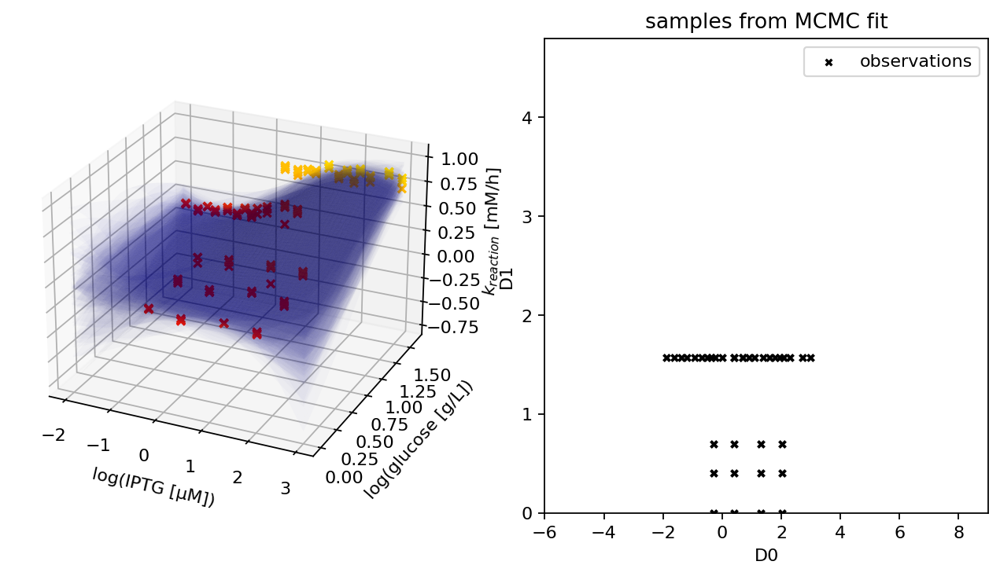

In [229]:
n_rff = 50
# create X-coordinates for 2D plotting
n = 100
x_dense = numpy.array(numpy.meshgrid(*[
    numpy.linspace(lb, ub, n)
    for lb, ub in BOUNDS
])).T.reshape(n*n, D)


# make the plot for both MAP and MCMC results
for label, _, rffs in [
    ('MCMC', pp_mcmc, rffs_mcmc),
]:
    #x_star_x, x_star_y = x_star[label]

    fig = pyplot.figure(dpi=160, figsize=(10, 5))
    ax3d = fig.add_subplot(1, 2, 1, projection='3d')
    ax2d = fig.add_subplot(1, 2, 2)

    # plot observations
    ax3d.scatter(
        X[:,0], X[:,1], Y,
        color=cm.autumn(Y),
        marker='x', label='$Y_{obs}$',
        alpha=1
    )

    # plot some RFFs        
    for rff in rffs[:n_rff]:
        z = rff(x_dense)
        ax3d.plot_surface(
            x_dense[:,0].reshape(n,n), x_dense[:,1].reshape(n,n), z.reshape(n,n),
            #marker='.', s=0.2,
            alpha=1/n_rff, color='blue'
        )

    ax3d.set_xlabel('log(IPTG [µM])')
    ax3d.set_ylabel('log(glucose [g/L])')
    ax3d.set_zlabel('$k_{reaction}$ [mM/h]')
    ax3d.view_init(elev=25, azim=-65)

    # plot heatmap and optima to the right
#     ax2d.imshow(
#         truth(x_dense).reshape(n,n),
#         extent=BOUNDS.flatten(),
#         cmap=cm.autumn
#     )
    ax2d.scatter(
        X[:, 0],
        X[:, 1],
        marker='x', color='black', s=12,
        label='observations'
    )
#     ax2d.scatter(
#         x_star_x[:, 0],
#         x_star_x[:, 1],
#         marker='.', color='black', s=0.5,
#         label='$p(x_*|X,Y)$'
#     )

    ax2d.set_title(f'samples from {label} fit')
    ax2d.set_xlabel('D0')
    ax2d.set_ylabel('D1')
    ax2d.set_xlim(*BOUNDS[0]*3)
    ax2d.set_ylim(*BOUNDS[1]*3)
    ax2d.legend(loc='upper right')

    pyplot.show()

In [230]:
pymc3.gp.Latent??

In [10]:
%load_ext watermark
%watermark -n -u -v -iv -w

Last updated: Wed Oct 06 2021

Python implementation: CPython
Python version       : 3.8.10
IPython version      : 7.22.0

pandas: 1.3.0
arviz : 0.11.2
pymc3 : 4.0
numpy : 1.21.0

Watermark: 2.2.0

